# Continuing from 1015 (Part 1)!

In [1]:
# Importing basic libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import plotly.express as px
sb.set() # set the default Seaborn style for graphics
%matplotlib inline

In [2]:
# Import Cleaned Data Frame
hotel_df = pd.read_csv('cleaned_hotel.csv')

### 16- Cancellation by Month and Day of Month

In [6]:
# Creating a new dataframe that is grouped by month and day of month
hotel_date_day_df = hotel_df.groupby(['arrival_date_day_of_month', 'arrival_date_month'], sort = False)['is_canceled'].sum().unstack() / hotel_df.groupby(['arrival_date_day_of_month', 'arrival_date_month'], sort = False).size().unstack()

hotel_date_day_df.columns  = pd.Categorical(hotel_date_day_df.columns, ['January', 'February', 'March', 'April', 
                                                                        'May', 'June', 'July', 'August', 'September', 
                                                                        'October', 'November', 'December'])
hotel_date_day_df = hotel_date_day_df[hotel_date_day_df.columns.sort_values()]

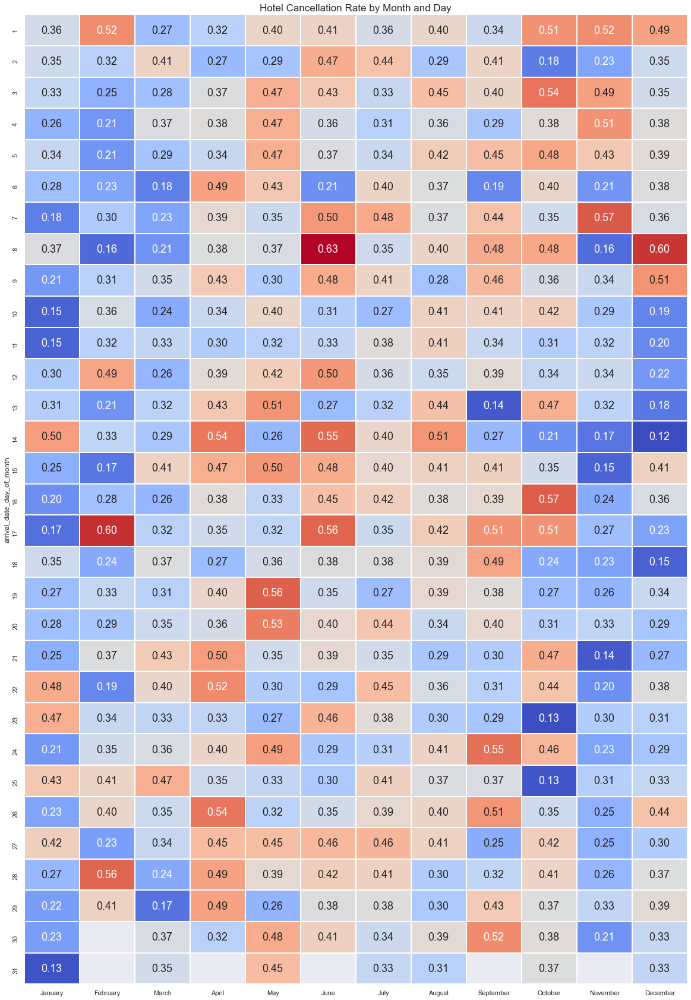

In [7]:
# Heatmap of cancellation rate by Month and Day of the month
f = plt.figure(figsize=(20, 30))
sb.heatmap(hotel_date_day_df, linewidths = 1, annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "coolwarm", cbar= False)
plt.title("Hotel Cancellation Rate by Month and Day", fontdict = {'fontsize': 17})
plt.show()

In [8]:
# Creating a new dataframe that is grouped by the month and day of week (different from day of month)
hotel_date_df = hotel_df.groupby(['arrival_day_of_week', 'arrival_date_month'], sort = False)['is_canceled'].sum().unstack() / hotel_df.groupby(['arrival_day_of_week', 'arrival_date_month'], sort = False).size().unstack()

hotel_date_df.index = pd.Categorical(hotel_date_df.index, ['Monday', 'Tuesday', 'Wednesday', 
                                                                   'Thursday', 'Friday','Saturday', 'Sunday'])
hotel_date_df.sort_index(inplace=True)

hotel_date_df.columns  = pd.Categorical(hotel_date_df.columns, ['January', 'February', 'March', 'April', 
                                                                        'May', 'June', 'July', 'August', 'September', 
                                                                        'October', 'November', 'December'])
hotel_date_df = hotel_date_df[hotel_date_df.columns.sort_values()]

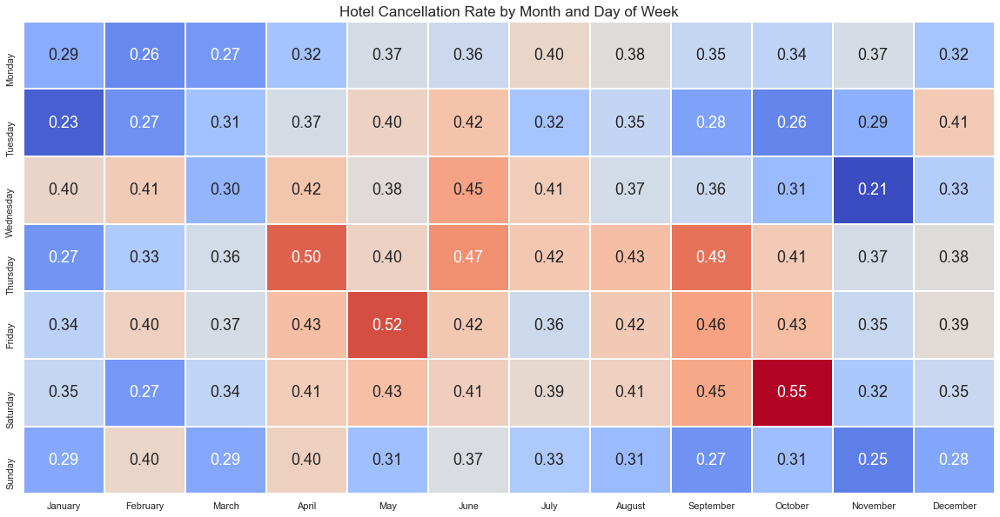

In [9]:
# Heatmap of cancellation rate by Month and Day of the week
f = plt.figure(figsize=(20, 10))
sb.heatmap(hotel_date_df, linewidths = 1, annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "coolwarm", cbar= False)
plt.title("Hotel Cancellation Rate by Month and Day of Week", fontdict = {'fontsize': 17})
plt.show()

#### Conclusion: There seems to be an indicaion that Thursday - Saturday especially during the months of April - October experiences higher cancellation rates.
----

### 17- Cancellation by Months

In [10]:
# Creating new dataframe groupby month of arrival
hotel_month = hotel_df[hotel_df['is_canceled'] == 1].groupby('arrival_date_month').size() / hotel_df.groupby('arrival_date_month').size()

hotel_month.index = pd.Categorical(hotel_month.index, ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
hotel_month.sort_index(inplace=True)

In [11]:
# Line graph of cancellation rate agaisnt month
px.line(hotel_month, y = hotel_month, x = hotel_month.index, title="Cancellation Rate by Month",
       labels=dict(index= "Month", y="Cancellation %"))

#### Conclusion: There is a clear trend in cancellation rate and month. The months of April to June have an espeically high cancellation rate.
----

### 18- Cancellation by Total Nights Stayed

In [12]:
# Frequecny plot of cancellation against total_nights
px.histogram(hotel_df, x = 'total_nights', color = 'is_canceled', width = 1000, height = 500, 
             opacity = 0.8, barmode='overlay', title="Number of Cancellation vs Total Nights Stayed")

In [13]:
# Boxplot of cancellation against total_nights
px.box(hotel_df, x = 'total_nights', color = 'is_canceled', width = 1000, height = 500,
      title="Boxplot of Total Nights Stayed by is_canceled")

In [14]:
# Boxplot of cancellation against total_nights if we eliminate outliers (total_nights > 10) 
filt = hotel_df['total_nights'] <= 10

px.box(hotel_df[filt], x = 'total_nights', color = 'is_canceled', width = 1000, height = 500,
      title="Boxplot of Total Nights Stayed by is_canceled (Total Nights <= 10)")

In [15]:
nights_data = hotel_df.groupby("total_nights")["is_canceled"].describe()
# Use only total_nights with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
nights_data = nights_data.loc[nights_data["count"] >= 10]

# Plotting scatter line plot of cancellation rate against total nights stayes
fig = px.scatter(x=nights_data.index, y=nights_data["mean"].values * 100, trendline = "ols", 
                 labels={'x':'total_nights', 'y':'Cancellation %'}, title = "Cancellation Rate against total_nights",
                 width = 1000, height = 600)
fig.show()

#### Conclusion: There is a slight linear relationship, albiet weaker than week nights and weekend nights
---

### 19- Cancellation by Lead Time

In [16]:
lead_cancel_data = hotel_df.groupby("lead_time")["is_canceled"].describe()
# Use only lead_times with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
lead_cancel_data_10 = lead_cancel_data.loc[lead_cancel_data["count"] >= 10]

# Plotting scatter line plot of cancellation rate against days in lead time
fig = px.scatter(x=lead_cancel_data_10.index, y=lead_cancel_data_10["mean"].values * 100, trendline = "ols", 
                 labels={'x':'lead_time', 'y':'Cancellation %'}, title = "Cancellation Rate against lead_time (Linear)",
                 width = 1000, height = 600)
fig.show()

In [17]:
lead_cancel_data = hotel_df.groupby("lead_time")["is_canceled"].describe()
# Use only lead_times with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
lead_cancel_data_10 = lead_cancel_data.loc[lead_cancel_data["count"] >= 10]

# Plotting scatter logged line plot of cancellation rate against days in lead time
fig = px.scatter(x=lead_cancel_data_10.loc[1:].index, y=lead_cancel_data_10.loc[1:]["mean"].values * 100, trendline = "ols", 
                 trendline_options=dict(log_x=True), labels={'x':'lead_time', 'y':'Cancellation %'}, 
                 title = "Cancellation Rate against lead_time (Logged)", width = 1300, height = 600)

fig.update_yaxes(range = [-5,105])
fig.show()

In [18]:
lead_cancel_data = hotel_df.groupby("lead_time")["is_canceled"].describe()
# Use only lead_times with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
lead_cancel_data_10 = lead_cancel_data.loc[lead_cancel_data["count"] >= 10]

# Plotting scatter fitted line plot of cancellation rate against days in lead time
fig = px.scatter(x=lead_cancel_data_10.index, y=lead_cancel_data_10["mean"].values * 100, trendline = "lowess", 
                 labels={'x':'lead_time', 'y':'Cancellation %'}, title = "Cancellation Rate against lead_time (Fitted)",
                 width = 1300, height = 600, trendline_options=dict(frac=0.2))
fig.show()

#### Conclusion: There is a postive relation between lead_time and cancellation rate, however it might not be a linear one. 
----

### 20- Cancellation by Arrival Day of Week

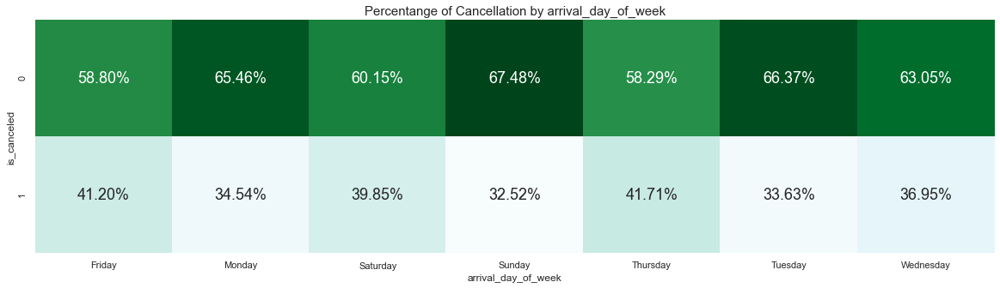

In [19]:
# Getting percentage of cancellation by arrival day of week
temp_df6 = hotel_df.groupby(['is_canceled', 'arrival_day_of_week']).size()
temp_df6 = temp_df6.groupby(level=1).apply(lambda x:100 * x / float(x.sum()))

# Plotting heatmap of the cancellation rate by arrival day of week
plt.figure(figsize = (20,5))
sb.heatmap(temp_df6.unstack()/100,annot = True, fmt = ".2%", 
           annot_kws = {"size": 18}, cmap = "BuGn", cbar= False)

# Setting formats
plt.title("Percentange of Cancellation by arrival_day_of_week",fontsize=15)
plt.show()

del temp_df6

#### Conclusion: There isn't much of a realtionship between arrival day of week and cancellation rate.
---

### 21- Cancellation by Booking Changes

In [20]:
booking_cancel_data = hotel_df.groupby("booking_changes")["is_canceled"].describe()
# Use only booking_changes with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
booking_cancel_data_10 = booking_cancel_data.loc[lead_cancel_data["count"] >= 10]

# Plotting scatter line plot of cancellation rate against days number of booking changes
fig = px.scatter(x=booking_cancel_data_10.index, y=booking_cancel_data_10["mean"].values * 100, trendline = "ols", 
                 labels={'x':'booking_changes', 'y':'Cancellation %'}, title = "Cancellation Rate against booking_changes",
                 width = 1000, height = 600)
fig.show()

#### Conclusion: There isn't much of a relationship between booking changes and canellation rate.
----

### 22- Cancellation by Total Special Request

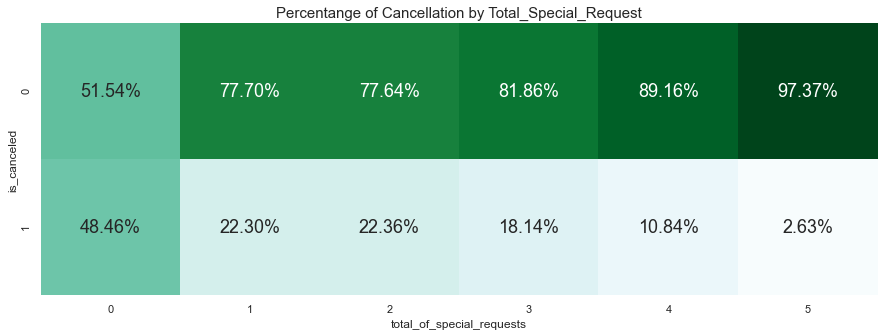

In [21]:
# Getting percentage of cancellation by number of special request
temp_df7 = hotel_df.groupby(['is_canceled', 'total_of_special_requests']).size()
temp_df7 = temp_df7.groupby(level=1).apply(lambda x:100 * x / float(x.sum()))

# Plotting heatmap of the cancellation rate by special request
plt.figure(figsize = (15,5))
sb.heatmap(temp_df7.unstack()/100,annot = True, fmt = ".2%", 
           annot_kws = {"size": 18}, cmap = "BuGn", cbar= False)

# Setting formats
plt.title("Percentange of Cancellation by Total_Special_Request", fontsize=15)
plt.show()

In [22]:
# Creating the new columns of whether the percentage is for cancel or not cancel and the annotation
temp_df7 = temp_df7.unstack().melt()
temp_df7["cancel"] = np.resize([0,1], 12)
temp_df7["cancel"] = temp_df7["cancel"].astype(str)
temp_df7["annot"] = round(temp_df7["value"],2).astype(str) + "%"

# Plotting the stacked bar chart and formatting
fig = px.bar(temp_df7, x="total_of_special_requests", y="value", color="cancel", text="annot",
            title="Cancellation Rate vs Total Special Request", labels=dict(value="Proportion of Guest %"))

fig.show()
del temp_df7

#### Conclusion: There is a clear inverse relationship between total special request and cancellation rate.
---

### 23- Cancellation by Stays in Week Nights

In [23]:
# Histogram of the number of cancellation against week nights stayed
px.histogram(hotel_df, x = 'stays_in_week_nights', color = 'is_canceled', width = 1000, height = 500, 
             opacity = 0.8, barmode='overlay', title="Number of Cancellation against Week Nights Stayed")

In [24]:
# Boxplot of cancellation against total_nights
px.box(hotel_df, x = 'stays_in_week_nights', color = 'is_canceled', width = 1000, height = 500,
      title="Boxplot of Week Nights Stayed by is_canceled")

In [25]:
stay_week_data = hotel_df.groupby("stays_in_week_nights")["is_canceled"].describe()
# Use only stays_in_week_nights with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
stay_week_data = stay_week_data.loc[stay_week_data["count"] >= 10]

# Plotting scatter line plot of cancellation rate against week nights stayed
fig = px.scatter(x=stay_week_data.index, y=stay_week_data["mean"].values * 100, trendline = "ols", 
                 labels={'x':'stays_in_week_nights', 'y':'Cancellation %'}, title = "Cancellation Rate against stays_in_week_nights",
                 width = 1000, height = 600)
fig.show()

#### Conclusion: There is a slight linear relationship between cancellation rate and week nights stayed.
----

### 24- Cancellation by Stays in Weekend Nights

In [26]:
# Histogram of the number of cancellation against weekend nights stayed
px.histogram(hotel_df, x = 'stays_in_weekend_nights', color = 'is_canceled', width = 1000, height = 500, 
             opacity = 0.8, barmode='overlay', title="Number of Cancellation against Weekend Nights Stayed")

In [27]:
# Boxplot of cancellation against total_nights
px.box(hotel_df, x = 'stays_in_weekend_nights', color = 'is_canceled', width = 1000, height = 500,
      title="Boxplot of Weekend Nights Stayed by is_canceled")

In [28]:
stay_weekend_data = hotel_df.groupby("stays_in_weekend_nights")["is_canceled"].describe()
# Use only stays_in_weekend_nights with more than 10 bookings for graph:
# This is because bookings with less than 10 counts will lead to extreme values in cancellation rate
# For example 0% or 100%, hence it is not an accurate representation.
stay_weekend_data = stay_weekend_data.loc[stay_weekend_data["count"] >= 10]

# Plotting scatter line plot of cancellation rate against weekend nights stayed
fig = px.scatter(x=stay_weekend_data.index, y=stay_weekend_data["mean"].values * 100, trendline = "ols", 
                 labels={'x':'stays_in_weekend_nights', 'y':'Cancellation %'}, title = "Cancellation Rate against stays_in_weekend_nights",
                 width = 1000, height = 600)
fig.show()

#### Conclusion: There is a slight linear relationship between cancellation rate and weekend nights stayed.
----

# **Machine Learning**
---
### **What is Machine Learning?**
Machine learning is a branch of artificial intelligence (AI) and computer science which focuses on the use of data and algorithms to imitate the way that humans learn, gradually improving its accuracy.



### **What Algorithms are We Using?**
In this project we will be using **7** different models:

1. Decision Tree Classifier


2. Random Forest Classifier


3. Gradient Boost Classifier


4. Cat Boost Classifier


5. XGBoost Classifier


6. AdaBoost Classifier


7. Logisitc Regression

### Pre-processing of Data
---

In this sub-section, we are doing some pre-processing to alter our data such that it is suitable to be fed into a machine learning algorithm.


Specifically, we will be:
- Using **OneHotEncoder** to encode categorical features as a one-hot numeric array. 


- Splitting the data using **train_test_split** into the train and test data.


- Create utility functions; `stat_train` and `stat_test` to test the accuracy of the different algorithms.

In [29]:
# Import OneHotEncoder to utilise categorical variable in the machine learning training
from sklearn.preprocessing import OneHotEncoder

In [30]:
ohe = OneHotEncoder()

# OneHotEncoding of categorical predictors (not the response)
hotel_cat = hotel_df[["market_segment","meal","deposit_type","customer_type","arrival_date_month",
                      "total_of_special_requests","arrival_day_of_week","useCompany"]]

ohe.fit(hotel_cat)
hotel_cat_ohe = pd.DataFrame(ohe.transform(hotel_cat).toarray(), 
                                  columns=ohe.get_feature_names(hotel_cat.columns))

# Check the encoded variables
hotel_cat_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116962 entries, 0 to 116961
Data columns (total 47 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   market_segment_Aviation        116962 non-null  float64
 1   market_segment_Complementary   116962 non-null  float64
 2   market_segment_Corporate       116962 non-null  float64
 3   market_segment_Direct          116962 non-null  float64
 4   market_segment_Groups          116962 non-null  float64
 5   market_segment_Offline TA/TO   116962 non-null  float64
 6   market_segment_Online TA       116962 non-null  float64
 7   market_segment_Undefined       116962 non-null  float64
 8   meal_BB                        116962 non-null  float64
 9   meal_FB                        116962 non-null  float64
 10  meal_HB                        116962 non-null  float64
 11  meal_SC                        116962 non-null  float64
 12  meal_Undefined                

In [31]:
# Combining Numeric features with the OHE Categorical features
hotel_num = hotel_df[["lead_time","is_repeated_guest","previous_cancellations","adr",
                      "stays_in_week_nights","stays_in_weekend_nights"]]

hotel_res = hotel_df['is_canceled'] # Storring the result in a seprate dataframe
hotel_ohe = pd.concat([hotel_num, hotel_cat_ohe, hotel_res], 
                           sort = False, axis = 1).reindex(index=hotel_num.index)

# Check the final dataframe
hotel_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116962 entries, 0 to 116961
Data columns (total 54 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   lead_time                      116962 non-null  int64  
 1   is_repeated_guest              116962 non-null  int64  
 2   previous_cancellations         116962 non-null  int64  
 3   adr                            116962 non-null  float64
 4   stays_in_week_nights           116962 non-null  int64  
 5   stays_in_weekend_nights        116962 non-null  int64  
 6   market_segment_Aviation        116962 non-null  float64
 7   market_segment_Complementary   116962 non-null  float64
 8   market_segment_Corporate       116962 non-null  float64
 9   market_segment_Direct          116962 non-null  float64
 10  market_segment_Groups          116962 non-null  float64
 11  market_segment_Offline TA/TO   116962 non-null  float64
 12  market_segment_Online TA      

In [32]:
# Import train test split library to split data into training and testing sets
from sklearn.model_selection import train_test_split

In [33]:
# Extract Response and Predictors
y = pd.DataFrame(hotel_ohe['is_canceled'])
X = pd.DataFrame(hotel_ohe.drop('is_canceled', axis = 1))

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [34]:
# Import confusion matrix which will be used to test the accuracy of the different ML algorithm
from sklearn.metrics import confusion_matrix

In [35]:
# Function stat_train, will be used to test for the accuracy of the algorithm on TRAIN data set.
def stat_train(a):
    y_train_pred = a.predict(X_train)

    # Print the Classification Accuracy
    print("Train Data")
    print("Accuracy  :\t", a.score(X_train, y_train))
    print()

    # Print the Accuracy Measures from the Confusion Matrix
    cmTrain = confusion_matrix(y_train, y_train_pred)
    tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
    fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

    print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
    print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
    print()

    print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
    print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

    # Plot the two-way Confusion Matrix
    sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18},
              cmap='coolwarm')

In [36]:
# Function stat_test, will be used to test for the accuracy of the algorithm on TEST data set.
def stat_test(a):  

    # Predict the Response corresponding to Predictors
    y_test_pred = a.predict(X_test)

    # Print the Classification Accuracy
    print("Test Data")
    print("Accuracy  :\t", a.score(X_test, y_test))
    print()

    # Print the Accuracy Measures from the Confusion Matrix
    cmTest = confusion_matrix(y_test, y_test_pred)
    tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
    fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)

    print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
    print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
    print()

    print("FPR Test :\t", (fpTest/(fpTest + tnTest)))
    print("FNR Test :\t", (fnTest/(fnTest + tpTest)))

    # Plot the two-way Confusion Matrix
    sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18},
              cmap='coolwarm')

### 1- Decision Tree Classifier

In [37]:
# Import Decision Tree Classifier model from sklearn
from sklearn.tree import DecisionTreeClassifier

In [38]:
# Creating the decision tree model and fitting it into the train data set
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

Train Data
Accuracy  :	 0.9895447827733197

TPR Train :	 0.9781547076442245
TNR Train :	 0.9963836816076002

FPR Train :	 0.0036163183923998673
FNR Train :	 0.02184529235577549


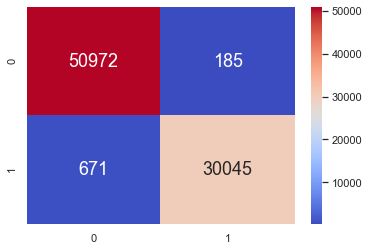

In [39]:
# Testing for accuracy on the train data set
stat_train(dtc)

Test Data
Accuracy  :	 0.8045826327339052

TPR Test :	 0.7425398504192793
TNR Test :	 0.8421654768442248

FPR Test :	 0.1578345231557752
FNR Test :	 0.2574601495807207


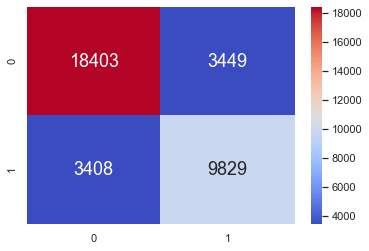

In [40]:
# Testing for accuracy on the test data set
stat_test(dtc)

In [41]:
# Import library to visualise what a decision tree looks like
from sklearn.tree import plot_tree

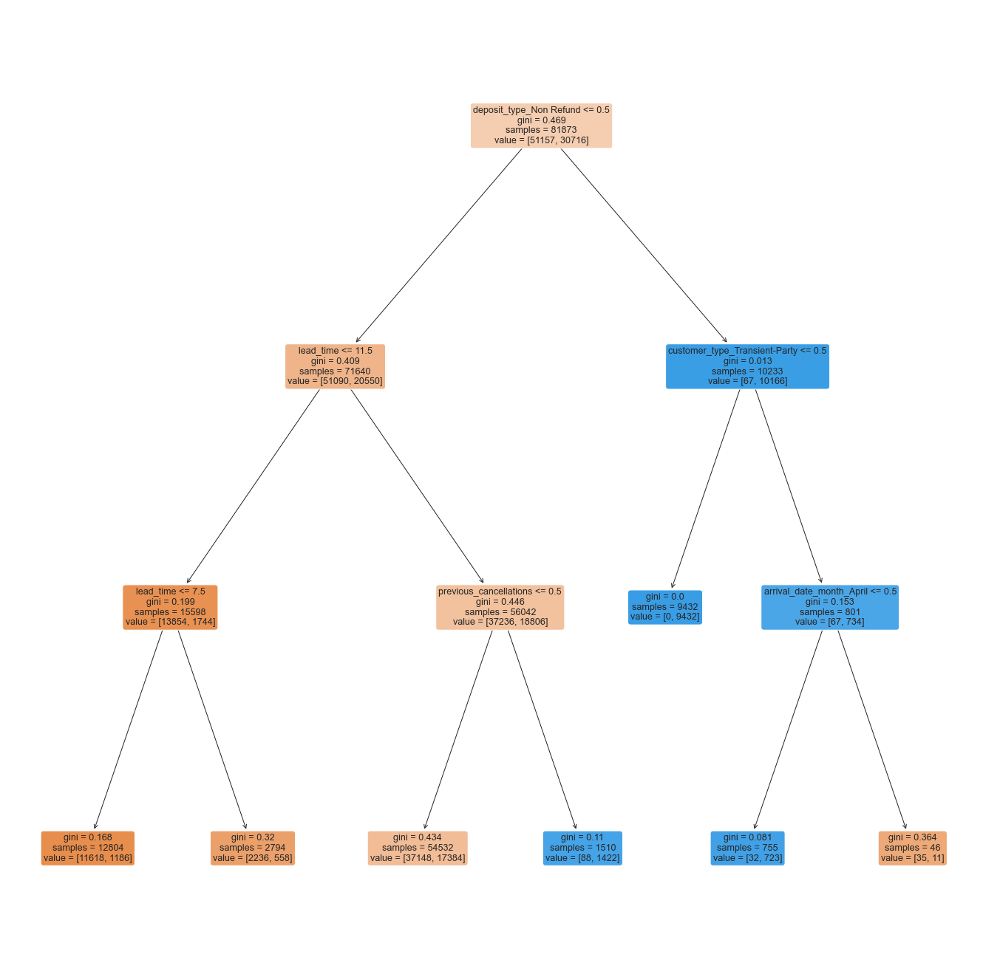

In [42]:
# Plotting what a decision tree would look like with limited depth
f = plt.figure(figsize=(24,24))
dtc1 = DecisionTreeClassifier(max_depth = 3)
dtc1.fit(X_train, y_train)
plot_tree(dtc1, filled=True, rounded=True, feature_names = X_train.columns)
plt.show()

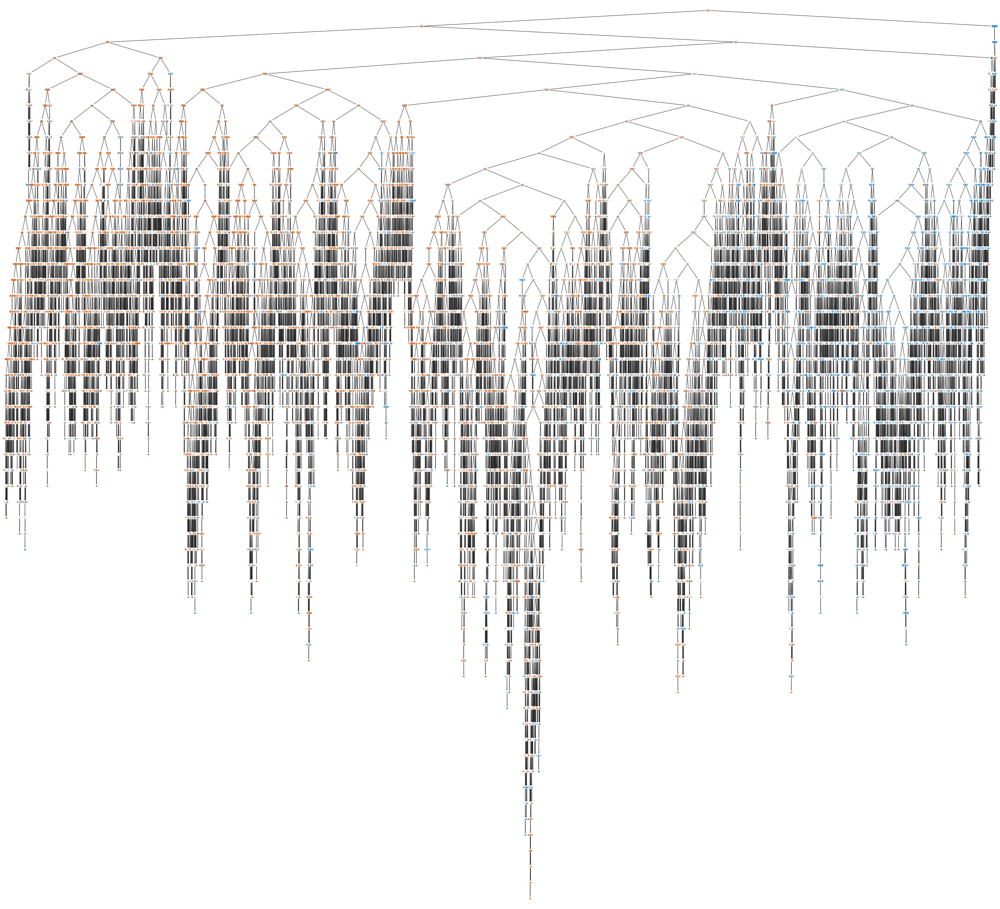

In [43]:
# Full decision tree
f = plt.figure(figsize=(48,45))
plot_tree(dtc, filled=True, rounded=True, feature_names = X_train.columns)
plt.show()

#### Conclusion: The Decision Tree is fairly accurate, however, the False Positive Rate can be improved.
----

### 2- Random Forest Classifier

In [44]:
# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

In [45]:
# Create the Random Forest object
rforest = RandomForestClassifier() 

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.is_canceled.ravel())

RandomForestClassifier()

Train Data
Accuracy  :	 0.989508140656871

TPR Train :	 0.9804010938924339
TNR Train :	 0.9949762495846121

FPR Train :	 0.005023750415387923
FNR Train :	 0.01959890610756609


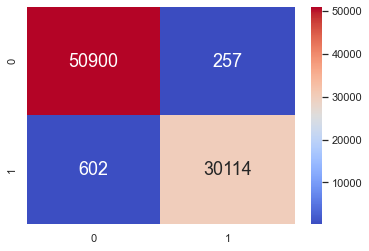

In [46]:
# Testing for accuracy on the train data set
stat_train(rforest)

Test Data
Accuracy  :	 0.8456496337883668

TPR Test :	 0.7333232605575282
TNR Test :	 0.9136921105619623

FPR Test :	 0.0863078894380377
FNR Test :	 0.26667673944247183


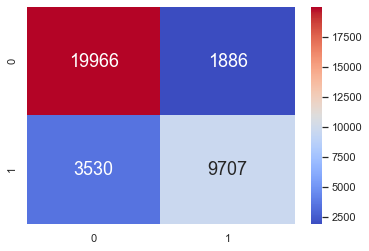

In [47]:
# Testing for accuracy on the test data set
stat_test(rforest)

#### Conclusion: The Random Forest Classifier provides a much better accuracy and a lower False Positive Rate.
----

### 3- Gradient Boost Classifier

In [48]:
# Import Gradient Boost Classifier from sklearn
from sklearn.ensemble import GradientBoostingClassifier

In [49]:
# Creating the cat boost model and fitting it into the train data set
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train.is_canceled.ravel())

GradientBoostingClassifier()

Train Data
Accuracy  :	 0.8088014363709648

TPR Train :	 0.6162911837478838
TNR Train :	 0.9243896240983639

FPR Train :	 0.07561037590163613
FNR Train :	 0.38370881625211617


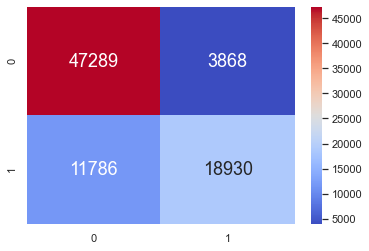

In [50]:
# Testing for accuracy on the train data set
stat_train(gb)

Test Data
Accuracy  :	 0.8068625495169426

TPR Test :	 0.6121477676210622
TNR Test :	 0.9248123741533956

FPR Test :	 0.07518762584660443
FNR Test :	 0.38785223237893784


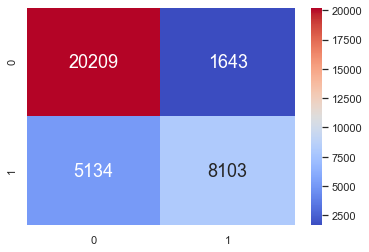

In [51]:
# Testing for accuracy on the test data set
stat_test(gb)

#### Conclusion: Similar accuracy to Decision Tree but high False Negative Rate
----

### 4- Cat Boost Classifier

In [52]:
# Import Cat Boost Classifier from catboost (Need to install the package first!!!)
# !pip install catboost
from catboost import CatBoostClassifier

In [53]:
# Creating the cat boost model and fitting it into the train data set
cat = CatBoostClassifier(iterations=500)
cat.fit(X_train, y_train)

Learning rate set to 0.127611
0:	learn: 0.5951910	total: 69.2ms	remaining: 34.5s
1:	learn: 0.5395393	total: 76ms	remaining: 18.9s
2:	learn: 0.5053342	total: 83.9ms	remaining: 13.9s
3:	learn: 0.4838394	total: 91.5ms	remaining: 11.3s
4:	learn: 0.4702673	total: 99ms	remaining: 9.8s
5:	learn: 0.4601524	total: 107ms	remaining: 8.79s
6:	learn: 0.4520112	total: 115ms	remaining: 8.08s
7:	learn: 0.4462715	total: 122ms	remaining: 7.5s
8:	learn: 0.4416501	total: 130ms	remaining: 7.12s
9:	learn: 0.4383505	total: 139ms	remaining: 6.8s
10:	learn: 0.4345122	total: 147ms	remaining: 6.53s
11:	learn: 0.4319514	total: 154ms	remaining: 6.26s
12:	learn: 0.4293745	total: 162ms	remaining: 6.06s
13:	learn: 0.4279537	total: 170ms	remaining: 5.89s
14:	learn: 0.4261786	total: 177ms	remaining: 5.72s
15:	learn: 0.4244309	total: 184ms	remaining: 5.56s
16:	learn: 0.4234676	total: 192ms	remaining: 5.46s
17:	learn: 0.4224302	total: 201ms	remaining: 5.39s
18:	learn: 0.4214873	total: 210ms	remaining: 5.32s
19:	learn: 0.

166:	learn: 0.3793810	total: 1.4s	remaining: 2.78s
167:	learn: 0.3792494	total: 1.4s	remaining: 2.77s
168:	learn: 0.3790828	total: 1.41s	remaining: 2.77s
169:	learn: 0.3789243	total: 1.42s	remaining: 2.76s
170:	learn: 0.3787623	total: 1.43s	remaining: 2.75s
171:	learn: 0.3786756	total: 1.44s	remaining: 2.74s
172:	learn: 0.3785555	total: 1.44s	remaining: 2.73s
173:	learn: 0.3784024	total: 1.45s	remaining: 2.72s
174:	learn: 0.3782596	total: 1.46s	remaining: 2.71s
175:	learn: 0.3780972	total: 1.47s	remaining: 2.7s
176:	learn: 0.3779585	total: 1.48s	remaining: 2.69s
177:	learn: 0.3778876	total: 1.48s	remaining: 2.68s
178:	learn: 0.3777113	total: 1.49s	remaining: 2.67s
179:	learn: 0.3776624	total: 1.5s	remaining: 2.66s
180:	learn: 0.3774728	total: 1.5s	remaining: 2.65s
181:	learn: 0.3773717	total: 1.51s	remaining: 2.64s
182:	learn: 0.3772453	total: 1.52s	remaining: 2.63s
183:	learn: 0.3770867	total: 1.53s	remaining: 2.62s
184:	learn: 0.3769226	total: 1.53s	remaining: 2.61s
185:	learn: 0.376

348:	learn: 0.3582927	total: 2.79s	remaining: 1.21s
349:	learn: 0.3582229	total: 2.8s	remaining: 1.2s
350:	learn: 0.3581061	total: 2.81s	remaining: 1.19s
351:	learn: 0.3580344	total: 2.82s	remaining: 1.18s
352:	learn: 0.3579484	total: 2.82s	remaining: 1.18s
353:	learn: 0.3577387	total: 2.83s	remaining: 1.17s
354:	learn: 0.3575926	total: 2.84s	remaining: 1.16s
355:	learn: 0.3575301	total: 2.85s	remaining: 1.15s
356:	learn: 0.3573605	total: 2.85s	remaining: 1.14s
357:	learn: 0.3572033	total: 2.86s	remaining: 1.14s
358:	learn: 0.3570990	total: 2.87s	remaining: 1.13s
359:	learn: 0.3570257	total: 2.88s	remaining: 1.12s
360:	learn: 0.3569234	total: 2.89s	remaining: 1.11s
361:	learn: 0.3568336	total: 2.9s	remaining: 1.1s
362:	learn: 0.3566939	total: 2.9s	remaining: 1.1s
363:	learn: 0.3565808	total: 2.91s	remaining: 1.09s
364:	learn: 0.3564473	total: 2.92s	remaining: 1.08s
365:	learn: 0.3563829	total: 2.93s	remaining: 1.07s
366:	learn: 0.3562993	total: 2.94s	remaining: 1.06s
367:	learn: 0.3561

Train Data
Accuracy  :	 0.8444175735590488

TPR Train :	 0.6987237921604376
TNR Train :	 0.9318959282209668

FPR Train :	 0.06810407177903317
FNR Train :	 0.30127620783956244


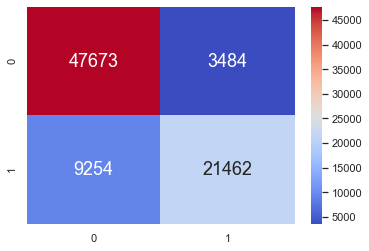

In [54]:
# Testing for accuracy on the train data set
stat_train(cat)

Test Data
Accuracy  :	 0.8304881871811679

TPR Test :	 0.6767394424718591
TNR Test :	 0.9236225517115139

FPR Test :	 0.07637744828848618
FNR Test :	 0.3232605575281408


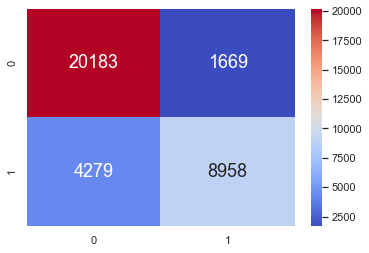

In [55]:
# Testing for accuracy on the test data set
stat_test(cat)

#### Conclusion: A better accuracy than the Decision Tree, however, the False Negative Rate is higher.
----

### 5- XGBoost Classifier

In [56]:
# Import XGBClassifier Classifier from xgboost (Need to install the package first!!!)
# !pip install xgboost
from xgboost import XGBClassifier

In [57]:
# Creating the XGB boost model and fitting it into the train data set
xgb = XGBClassifier(booster = 'gbtree', learning_rate = 0.1)
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

Train Data
Accuracy  :	 0.8211009734588937

TPR Train :	 0.6416525589269436
TNR Train :	 0.9288464921711593

FPR Train :	 0.07115350782884063
FNR Train :	 0.3583474410730564


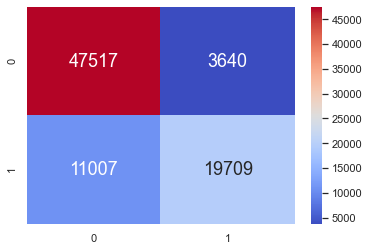

In [58]:
# Testing for accuracy on the train data set
stat_train(xgb)

Test Data
Accuracy  :	 0.8170081792014592

TPR Test :	 0.6333761426305055
TNR Test :	 0.9282445542742083

FPR Test :	 0.07175544572579169
FNR Test :	 0.3666238573694946


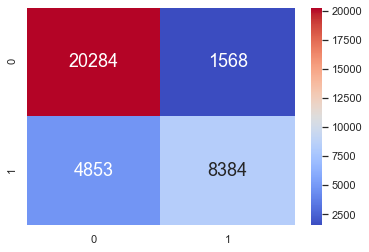

In [59]:
# Testing for accuracy on the test data set
stat_test(xgb)

#### Conclusion: Slightly better accuracy than Decision Tree but high False Negative Rate
----

### 6- AdaBoost Classifier

In [60]:
#import from sklearn the adaboost model
from sklearn.ensemble import AdaBoostClassifier

In [61]:
# Creating the AdaBoost model and fitting it into the train data set
ada = AdaBoostClassifier()
ada.fit(X_train, y_train.is_canceled.ravel())

AdaBoostClassifier()

Train Data
Accuracy  :	 0.805918923210338

TPR Train :	 0.6115379606719625
TNR Train :	 0.9226303340696288

FPR Train :	 0.07736966593037121
FNR Train :	 0.3884620393280375


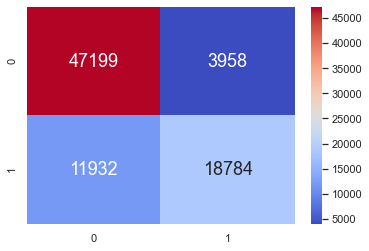

In [62]:
# Testing for accuracy on the train data set
stat_train(ada)

Test Data
Accuracy  :	 0.8049816181709367

TPR Test :	 0.6080682934199592
TNR Test :	 0.9242632253340656

FPR Test :	 0.07573677466593447
FNR Test :	 0.3919317065800408


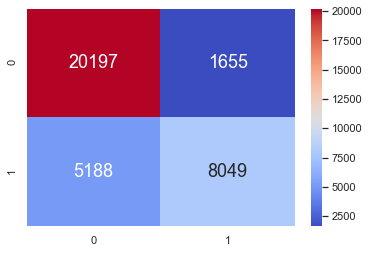

In [63]:
# Testing for accuracy on the test data set
stat_test(ada)

#### Conclusion: Slightly lower accuracy but too high False Negative Rate
----

### 7- Logistic Regression

In [64]:
# Import logisitc regression Classifier from lightgbm
from sklearn.linear_model import LogisticRegression

In [65]:
# Creating the logisitc regression model and fitting it into the train data set
lr = LogisticRegression(max_iter=400000)
lr.fit(X_train, y_train.is_canceled.ravel())

LogisticRegression(max_iter=400000)

Train Data
Accuracy  :	 0.7975156645047818

TPR Train :	 0.5826930589920563
TNR Train :	 0.926500772132846

FPR Train :	 0.07349922786715406
FNR Train :	 0.41730694100794374


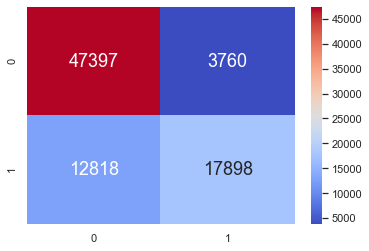

In [66]:
# Testing for accuracy on the train data set
stat_train(lr)

Test Data
Accuracy  :	 0.797685884465217

TPR Test :	 0.5819294402054846
TNR Test :	 0.9283818414790408

FPR Test :	 0.07161815852095918
FNR Test :	 0.41807055979451535


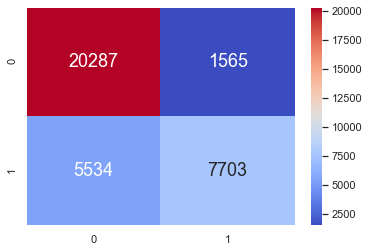

In [67]:
# Testing for accuracy on the test data set
stat_test(lr)

#### Conclusion: Slightly lower accuracy, but main issue is that the False Negative Rate is too high.
----

# **Conclusion**
---
### **What Machine Learning Model did We Choose?**
We decided to pick **Random Forest** as our model of choice. This is because it has:
- Highest accuracy of ~84% on test data.
- Relatively low FPR of ~8%.

Random forests consist of multiple single decision trees each based on a random sample of the training data. They are typically more accurate than single decision trees. The decision boundary becomes more accurate and stable as more trees are added.  

After selecting Random Forest as our model of choice, we decided to look into the features that the model priotised. Here is our findings:

In [68]:
importance = rforest.feature_importances_
sorted_idx = rforest.feature_importances_.argsort()
sort = np.flip(sorted_idx)

# Printing out the top 10 most important variables
for a in (sort[:10]):
    print('Feature: %-40s Score: %0.5f' % (hotel_ohe.columns[a],importance[a]))

Feature: lead_time                                Score: 0.21484
Feature: adr                                      Score: 0.17269
Feature: deposit_type_No Deposit                  Score: 0.08851
Feature: deposit_type_Non Refund                  Score: 0.08435
Feature: stays_in_week_nights                     Score: 0.05367
Feature: previous_cancellations                   Score: 0.04428
Feature: total_of_special_requests_0              Score: 0.03028
Feature: stays_in_weekend_nights                  Score: 0.02900
Feature: market_segment_Online TA                 Score: 0.02493
Feature: customer_type_Transient                  Score: 0.01588


#### Remarks: The top 10 most important variables coincides with our findings in our EDA. In our EDA, these variables have demonstrated to have some significance in affecting cancellation rate.
---

### **What Have We Done?**
In this project we have:
- Cleaned raw data to be utilised later on in EDA.


- Performed EDA using different tools to find out which variables are important / relevant.


- Utilised different Machine Learning algorithms to find out which is the most suitable. 


In conclusion, our model has managed to attain a relatively high accuracy of ~**85%**. This allows hotels to have a relatively high confidence in predicting which customer will cancel their reservations, thus, allowing them to maximise utilisation rates.


#### Thank you for taking the time to read through our code. We hope you had as much fun reading as we did doing this project! 